In [75]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import matplotlib.pyplot as plt

In [76]:
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [77]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [78]:
# Drop the columns we don't need for our observations
titanic_df.drop("Cabin", axis=1, inplace=True)
titanic_df.drop("Name", axis=1, inplace=True)
titanic_df.drop("PassengerId", axis=1, inplace=True)
titanic_df.drop("Ticket", axis=1, inplace=True)

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [79]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: `get_dummies()`

In [80]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"], dtype=int)
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Embarked,Sex_female,Sex_male
0,0,3,22.0,1,0,7.2500,S,0,1
1,1,1,38.0,1,0,71.2833,C,1,0
2,1,3,26.0,0,0,7.9250,S,1,0
3,1,1,35.0,1,0,53.1000,S,1,0
4,0,3,35.0,0,0,8.0500,S,0,1


Now, we do the same to the "Embarked" column.

In [81]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"], dtype=int)
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1


Accuracy on the development set: 0.7622377622377622


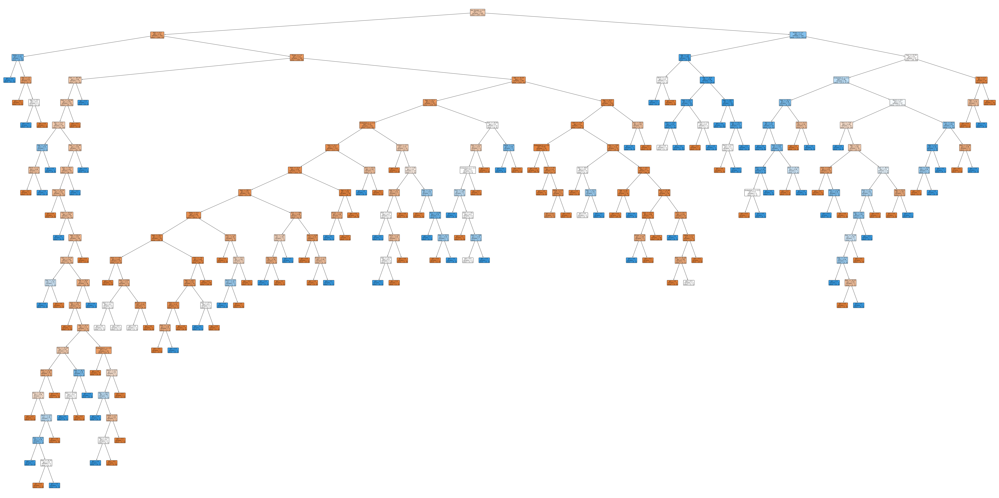

In [82]:
# Creating dependent and independent variables
X = titanic_df.drop("Survived", axis=1)
y = titanic_df["Survived"]

# Split the original dataset into training and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training set further into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=42)

# Training a model without pruning
unpruned = DecisionTreeClassifier(max_depth=None, random_state=42)
unpruned.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(unpruned, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

print("Accuracy on the development set:", unpruned.score(X_dev, y_dev))

Accuracy on the training set: 0.7996485061511424
Accuracy on the development set: 0.8181818181818182


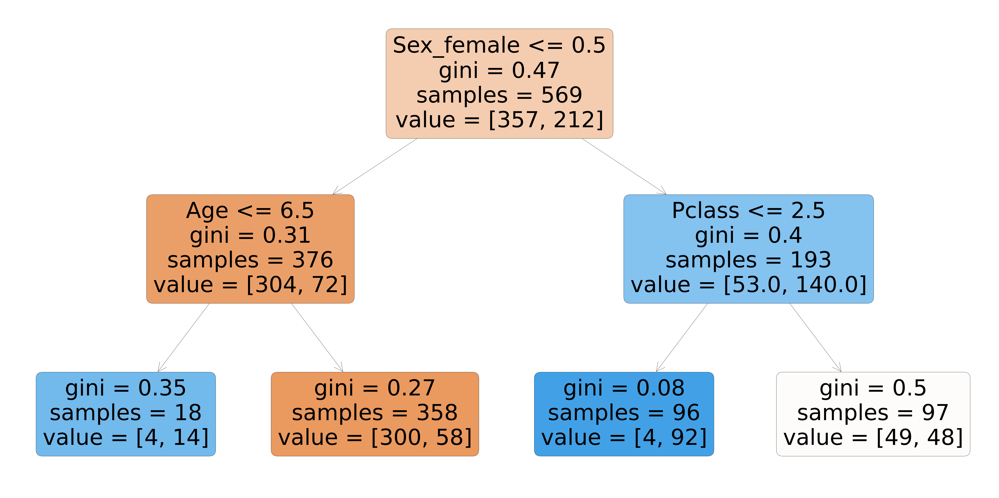

In [83]:
# Training a model with max depth 2
pruned_depth_2 = DecisionTreeClassifier(max_depth=2, random_state=42)
pruned_depth_2.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_2, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_2 = pruned_depth_2.score(X_train, y_train)
dev_score_2 = pruned_depth_2.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_2)
print("Accuracy on the development set:", dev_score_2)

Accuracy on the training set: 0.8330404217926186
Accuracy on the development set: 0.8321678321678322


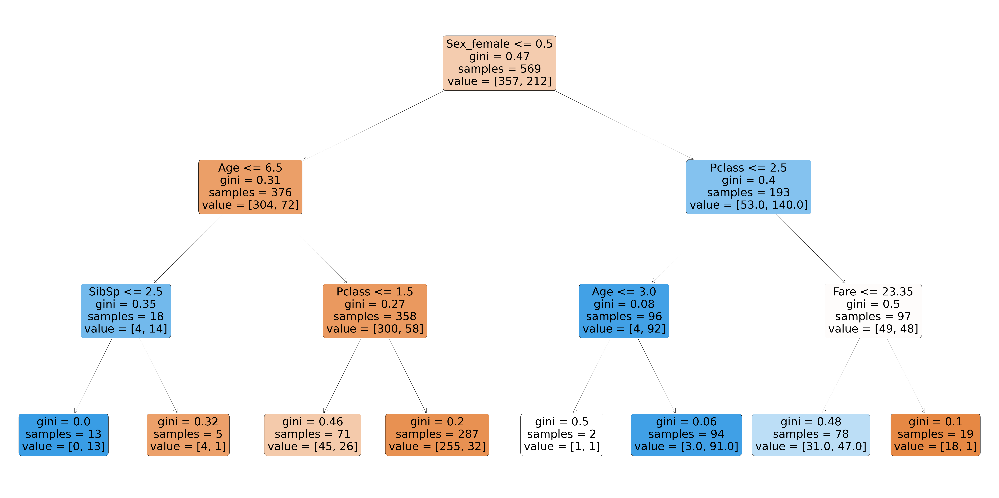

In [84]:
# Training a model with max depth 3
pruned_depth_3 = DecisionTreeClassifier(max_depth=3, random_state=42)
pruned_depth_3.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_3, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_3 = pruned_depth_3.score(X_train, y_train)
dev_score_3 = pruned_depth_3.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_3)
print("Accuracy on the development set:", dev_score_3)

Accuracy on the training set: 0.8383128295254832
Accuracy on the development set: 0.8321678321678322


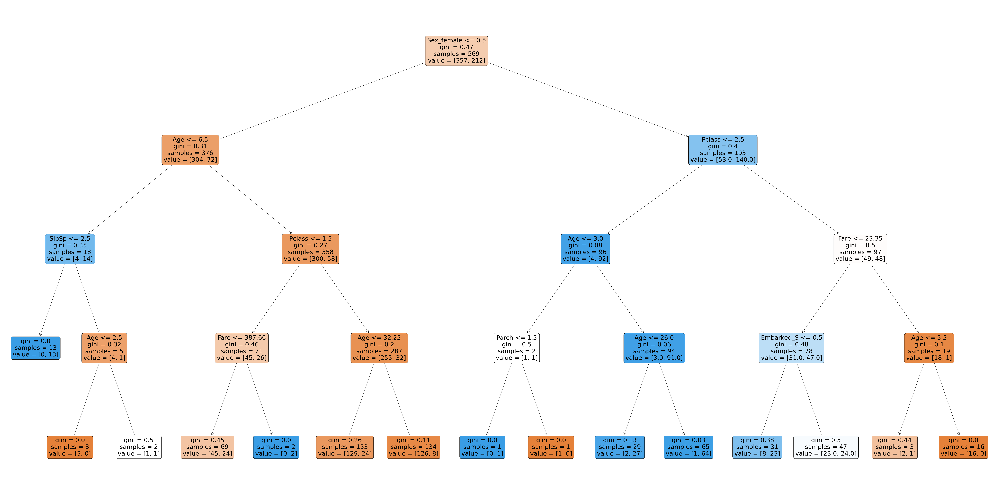

In [85]:
# Training a model with max depth 4
pruned_depth_4 = DecisionTreeClassifier(max_depth=4, random_state=42)
pruned_depth_4.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_4, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_4 = pruned_depth_4.score(X_train, y_train)
dev_score_4 = pruned_depth_4.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_4)
print("Accuracy on the development set:", dev_score_4)

Accuracy on the training set: 0.8541300527240774
Accuracy on the development set: 0.8181818181818182


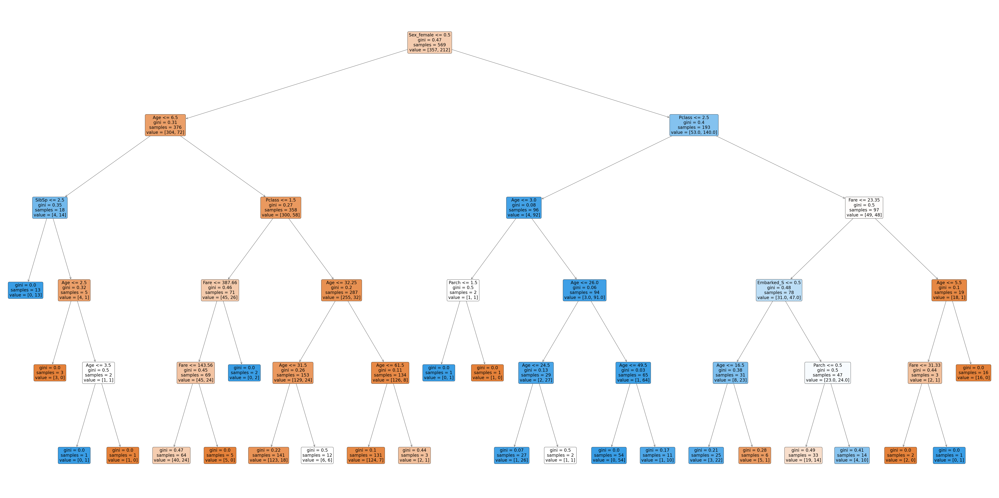

In [86]:
# Training a model with max depth 5
pruned_depth_5 = DecisionTreeClassifier(max_depth=5, random_state=42)
pruned_depth_5.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_5, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_5 = pruned_depth_5.score(X_train, y_train)
dev_score_5 = pruned_depth_5.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_5)
print("Accuracy on the development set:", dev_score_5)

Accuracy on the training set: 0.8787346221441125
Accuracy on the development set: 0.8041958041958042


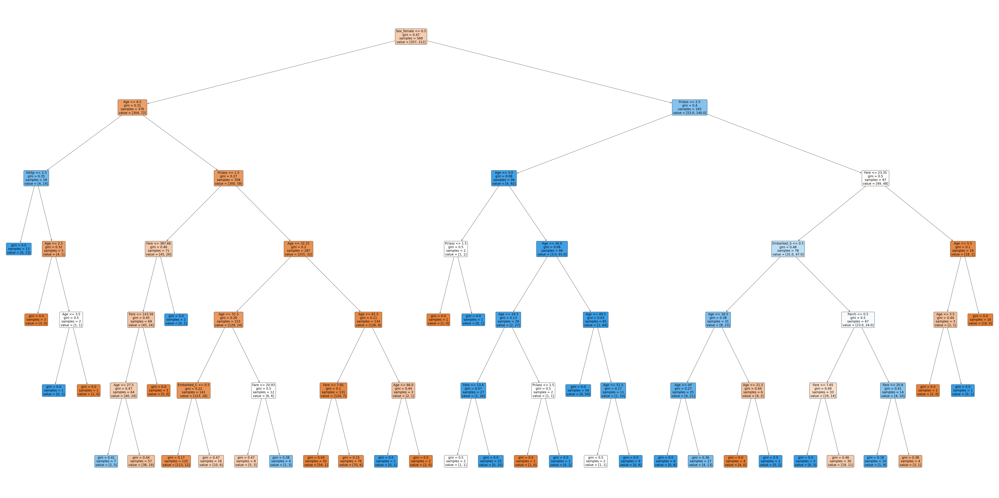

In [87]:
# Training a model with max depth 6
pruned_depth_6 = DecisionTreeClassifier(max_depth=6, random_state=42)
pruned_depth_6.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_6, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_6 = pruned_depth_6.score(X_train, y_train)
dev_score_6 = pruned_depth_6.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_6)
print("Accuracy on the development set:", dev_score_6)

Accuracy on the training set: 0.8910369068541301
Accuracy on the development set: 0.8111888111888111


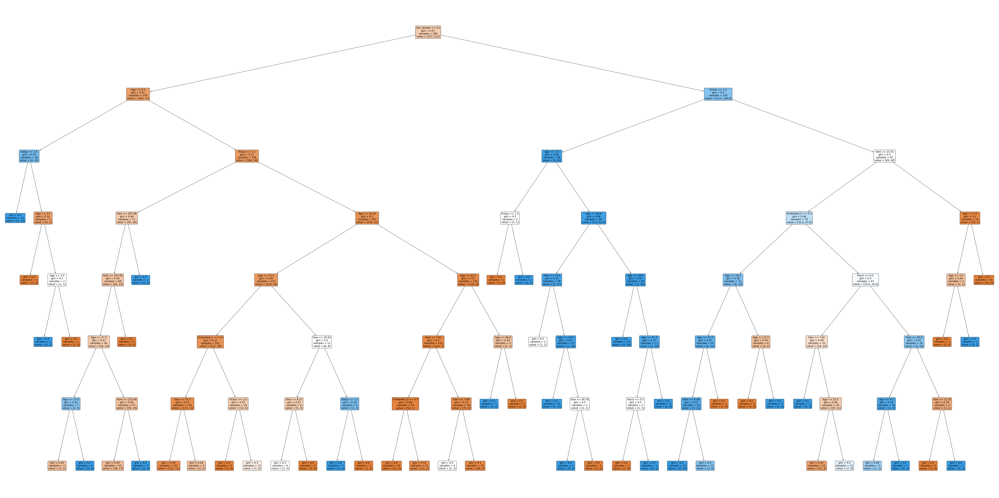

In [88]:
# Training a model with max depth 7
pruned_depth_7 = DecisionTreeClassifier(max_depth=7, random_state=42)
pruned_depth_7.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_7, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_7 = pruned_depth_7.score(X_train, y_train)
dev_score_7 = pruned_depth_7.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_7)
print("Accuracy on the development set:", dev_score_7)

Accuracy on the training set: 0.9138840070298769
Accuracy on the development set: 0.8111888111888111


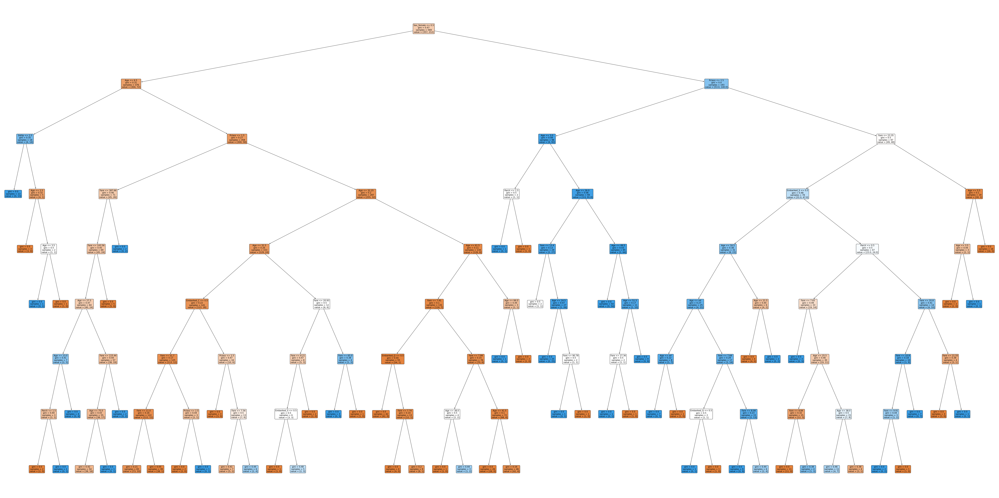

In [89]:
# Training a model with max depth 8
pruned_depth_8 = DecisionTreeClassifier(max_depth=8, random_state=42)
pruned_depth_8.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_8, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_8 = pruned_depth_8.score(X_train, y_train)
dev_score_8 = pruned_depth_8.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_8)
print("Accuracy on the development set:", dev_score_8)

Accuracy on the training set: 0.9261862917398945
Accuracy on the development set: 0.8181818181818182


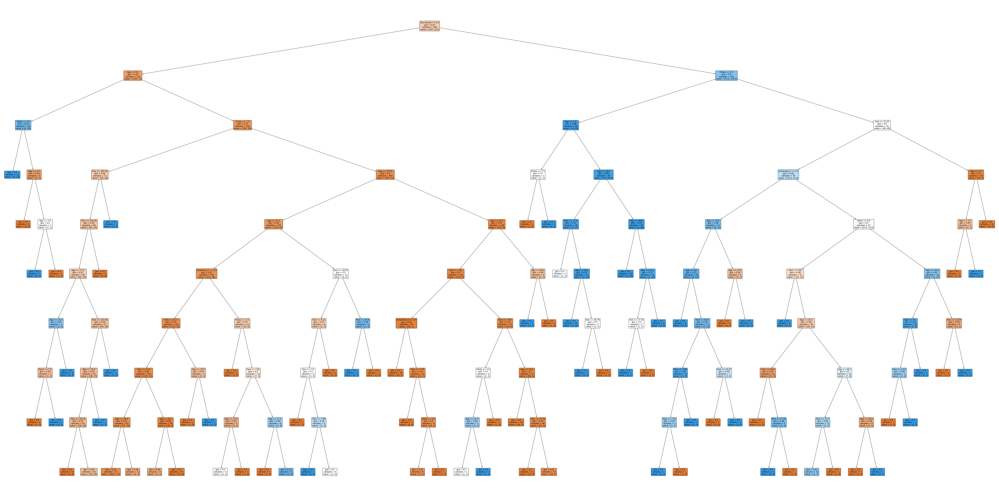

In [90]:
# Training a model with max depth 9
pruned_depth_9 = DecisionTreeClassifier(max_depth=9, random_state=42)
pruned_depth_9.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_9, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_9 = pruned_depth_9.score(X_train, y_train)
dev_score_9 = pruned_depth_9.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_9)
print("Accuracy on the development set:", dev_score_9)

Accuracy on the training set: 0.9349736379613357
Accuracy on the development set: 0.7902097902097902


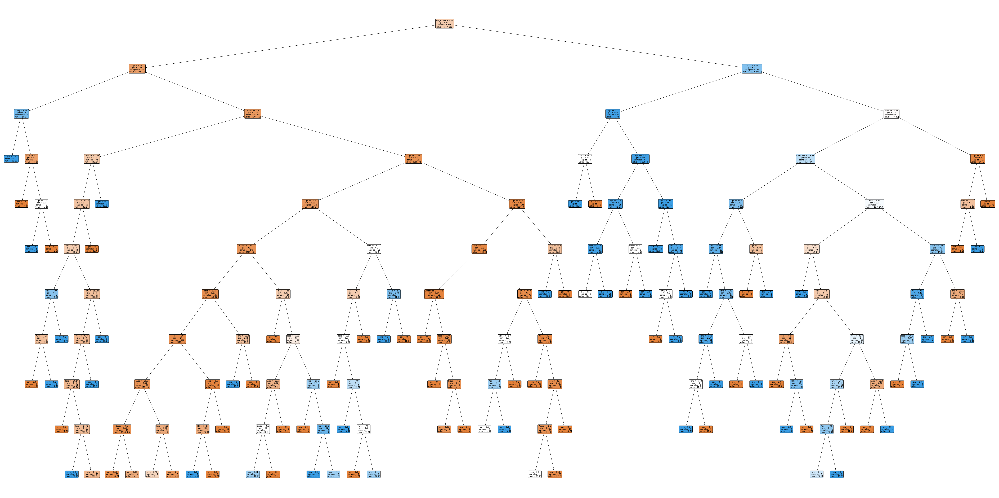

In [91]:
# Training a model with max depth 10
pruned_depth_10 = DecisionTreeClassifier(max_depth=10, random_state=42)
pruned_depth_10.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_depth_10, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for training and development data
train_score_10 = pruned_depth_10.score(X_train, y_train)
dev_score_10 = pruned_depth_10.score(X_dev, y_dev)

print("Accuracy on the training set:", train_score_10)
print("Accuracy on the development set:", dev_score_10)

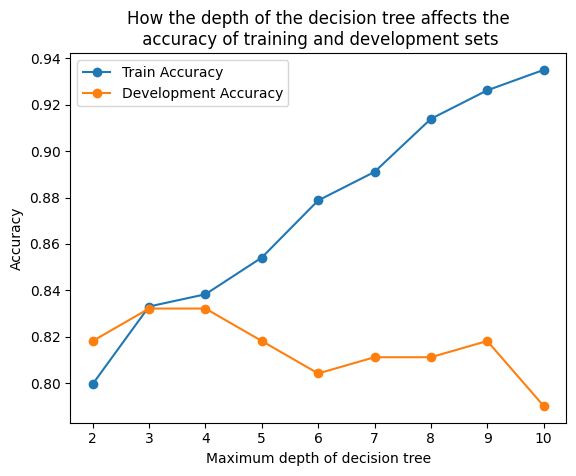

In [92]:
# Making lists of all the depths, train scores and dev scores
depths = list(range(2, 11))
all_train_scores = [train_score_2, train_score_3, train_score_4, train_score_5, train_score_6,
                    train_score_7, train_score_8, train_score_9, train_score_10]

all_dev_scores = [dev_score_2, dev_score_3, dev_score_4, dev_score_5, dev_score_6, 
                  dev_score_7, dev_score_8, dev_score_9, dev_score_10]


# Plotting a graph
plt.plot(depths, all_train_scores, label="Train Accuracy", marker="o")
plt.plot(depths, all_dev_scores, label="Development Accuracy", marker="o")
plt.xlabel("Maximum depth of decision tree")
plt.ylabel("Accuracy")
plt.title("How the depth of the decision tree affects the\n accuracy of training and development sets")
plt.legend()
plt.show()

We have now built several models with different max depths and we can see from the graph above that the development accuracy peaks at a max depth of 3 and 4 which means this is the optimal depth to maximise the performance of our model and prevent underfitting and overfitting. It's worth noting that the accuracy on the training set will always increase as the max depth increases and an unpruned tree will have a training accuracy of 1 since it encompasses all of the data.

Accuracy on the test set: 0.7988826815642458


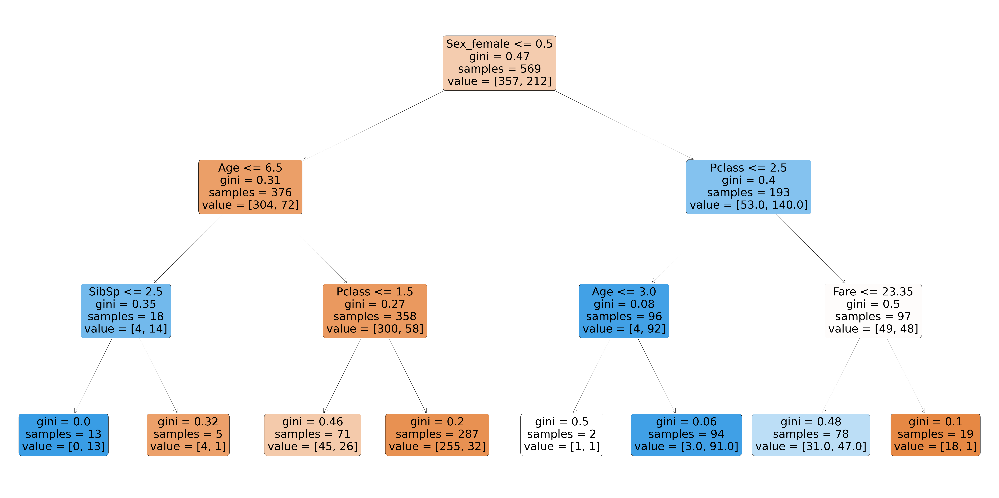

In [93]:
# Training a final model with max depth 3
pruned_final_3 = DecisionTreeClassifier(max_depth=3, random_state=42)
pruned_final_3.fit(X_train, y_train)

# Plotting the tree
fig = plt.figure(figsize=(100,50))
tree.plot_tree(pruned_final_3, feature_names=X.columns, rounded = True, proportion = False, precision = 2, filled = True)

# Storing the score for test data
test_score_3 = pruned_final_3.score(X_test, y_test)

print("Accuracy on the test set:", test_score_3)